**Veri Kümesi Bilgileri:**

Türkiye'de yetiştirilen iki üzüm türüne (Kecimen ve Besni) ait veriler var

Bunları sınıflandırmaya çalışacağız

Normalde elimizde image olsaydı deep learning ile sınıfladırma yapabilirdik.


- Türkiye'de yetiştirilen Keçimen ve Besni kuru üzüm çeşitlerinin CVS yöntemi ile görüntüleri elde edilmiştir.

- Bu görüntüler çeşitli ön işleme aşamalarından geçirilmiş ve 7 morfolojik özellik çıkarılmıştır.

- Git benzeri bir açık kaynaklı versiyon kontrol sistemi olan CVS (Concurrent Versions System) kullanılmıştır.

- Her iki çeşitten 450 adet olmak üzere toplam 900 adet kuru üzüm tanesi kullanılmıştır.

- Bu özellikler üç farklı yapay zeka tekniği kullanılarak sınıflandırılmıştır.


**Area:** Kuru üzümün sınırları içindeki piksel sayısını verir.

**Perimeter:** Kuru üzümün sınırları ile çevresindeki pikseller arasındaki mesafeyi hesaplayarak çevreyi ölçer.

**MajorAxisLength:** Üzüm üzerine çizilebilecek en uzun çizgi olan ana eksenin uzunluğunu verir.

**MinorAxisLength:** Üzüm üzerine çizilebilecek en kısa çizgi olan küçük eksenin uzunluğunu verir.

**Eccentricity:** Kuru üzümlerle aynı momentlere sahip olan elipsin eksantrikliğinin bir ölçüsünü verir. Bir elipsin şeklinin uzun aksı ile kısa aksı arasındaki farkın uzun aksa bölünmesiyle elde edilen bir orandır. Bu oran, elipsin şeklinin ne kadar "uzun" veya "düz" olduğunu ölçer.

**ConvexArea:** Kuru üzümün oluşturduğu bölgenin en küçük dışbükey kabuğunun piksel sayısını verir. En küçük dışbükey kabuk, belirli bir şekli tamamen kaplayan en küçük dışbükey çokgeni ifade eder. Kuru üzüm şeklini çevreleyen en küçük dışbükey çokgenin piksel sayısı

**Extent:** Kuru üzümün oluşturduğu bölgenin sınırlayıcı kutudaki toplam piksellere oranını verir.

**Class:** Kecimen and Besni kuru üzümleri.

# <font color='blue'> <b>Exploratory Data Analysis (EDA) and Visualization</b><font color='black'>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf   # !pip install cufflinks

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

%matplotlib inline

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [3]:
df = pd.read_excel("Raisin_Dataset.xlsx")  

In [4]:
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,Kecimen
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,Kecimen
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,Kecimen
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,Kecimen
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,Kecimen
...,...,...,...,...,...,...,...,...
895,83248,430.077308,247.838695,0.817263,85839,0.668793,1129.072,Besni
896,87350,440.735698,259.293149,0.808629,90899,0.636476,1214.252,Besni
897,99657,431.706981,298.837323,0.721684,106264,0.741099,1292.828,Besni
898,93523,476.344094,254.176054,0.845739,97653,0.658798,1258.548,Besni


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    object 
dtypes: float64(5), int64(2), object(1)
memory usage: 56.4+ KB


In [6]:
df.shape

(900, 8)

In [6]:
df.duplicated().sum()  

0

In [7]:
df.isnull().sum().any()  

False

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,900.0,87804.127778,39002.111390,25387.000000,59348.000000,78902.000000,105028.250000,235047.000000
MajorAxisLength,900.0,430.929950,116.035121,225.629541,345.442898,407.803951,494.187014,997.291941
MinorAxisLength,900.0,254.488133,49.988902,143.710872,219.111126,247.848409,279.888575,492.275279
Eccentricity,900.0,0.781542,0.090318,0.348730,0.741766,0.798846,0.842571,0.962124
ConvexArea,900.0,91186.090000,40769.290132,26139.000000,61513.250000,81651.000000,108375.750000,278217.000000
Extent,900.0,0.699508,0.053468,0.379856,0.670869,0.707367,0.734991,0.835455
Perimeter,900.0,1165.906636,273.764315,619.074000,966.410750,1119.509000,1308.389750,2697.753000


In [9]:
df["Class"].value_counts()  

Class
Kecimen    450
Besni      450
Name: count, dtype: int64

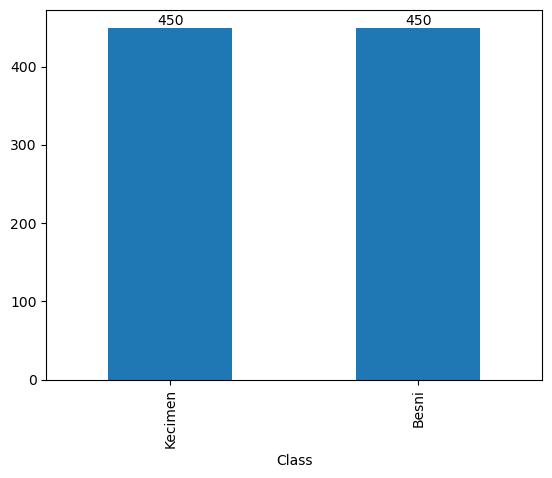

In [10]:
ax = df["Class"].value_counts().plot(kind='bar')
ax.bar_label(ax.containers[0]); 

# balanced bir data

**Balanced (dengeli) bir veri seti**, sınıflandırma problemlerinde her bir sınıfın benzer sayıda örnek içerdiği bir veri setidir. Örn; Kecimen: 450 - Besni: 450

**Unbalanced-Imbalanced (dengesiz) veri seti**, bir sınıfın diğerlerine göre çok daha fazla örneğe sahip olduğu durumlarda ortaya çıkar. Örn; diyabet (1): 300 - diyabet olmayan (0): 5000

Bu veri seti özelinde aynı sayıda iki sınıfa sahibiz. Bu yüzden modelin performansını değerlendirmek için **accuracy** kullanabiliriz.

In [7]:
df["Class"] = df["Class"].map({"Kecimen":0,"Besni":1})

In [8]:
df

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,0
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,0
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,0
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,0
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,0
...,...,...,...,...,...,...,...,...
895,83248,430.077308,247.838695,0.817263,85839,0.668793,1129.072,1
896,87350,440.735698,259.293149,0.808629,90899,0.636476,1214.252,1
897,99657,431.706981,298.837323,0.721684,106264,0.741099,1292.828,1
898,93523,476.344094,254.176054,0.845739,97653,0.658798,1258.548,1


In [13]:
df.iloc[:,:-1].iplot(kind="box")

In [14]:
fig = px.box(df, color="Class", color_discrete_map={"Kecimen":'#FF0000',"Besni":'#00FF00'})
fig.show()

In [15]:
df.iplot(kind="bar")

In [16]:
fig = px.bar(df,x=df.index,y="Area",color="Class",color_discrete_map={"Kecimen":'#FF0000',"Besni":'#00FF00'})
fig.show();

- Logistik regresyonda, katsayıların doğru tahmin edilmesi için multikolinaritinin önemi lineer regresyona göre daha azdır.

- Logistik regresyonda, bağımlı değişken kategorik olduğu için doğrusal bir model kullanılmaz. 

- Burda katsayıların yorumlanması odds üzerinden yapılır.

- Logistik regresyon, bağımlı değişkenin olasılığını tahmin eder. 

- Bu durumda, bağımsız değişkenlerin birbirleriyle yüksek derecede korele olması, lojistik regresyonun performansını etkilemez.

- Ancak, aşırı multikolinarity, log reg un doğruluğunu ve güvenilirliğini azaltabilir ve sonuçları yanıltıcı hale getirebilir.

- Ayrıca; logistic regresyonda arkada planda l1 ve l2 çalıştığı için bu sorun giderilir.

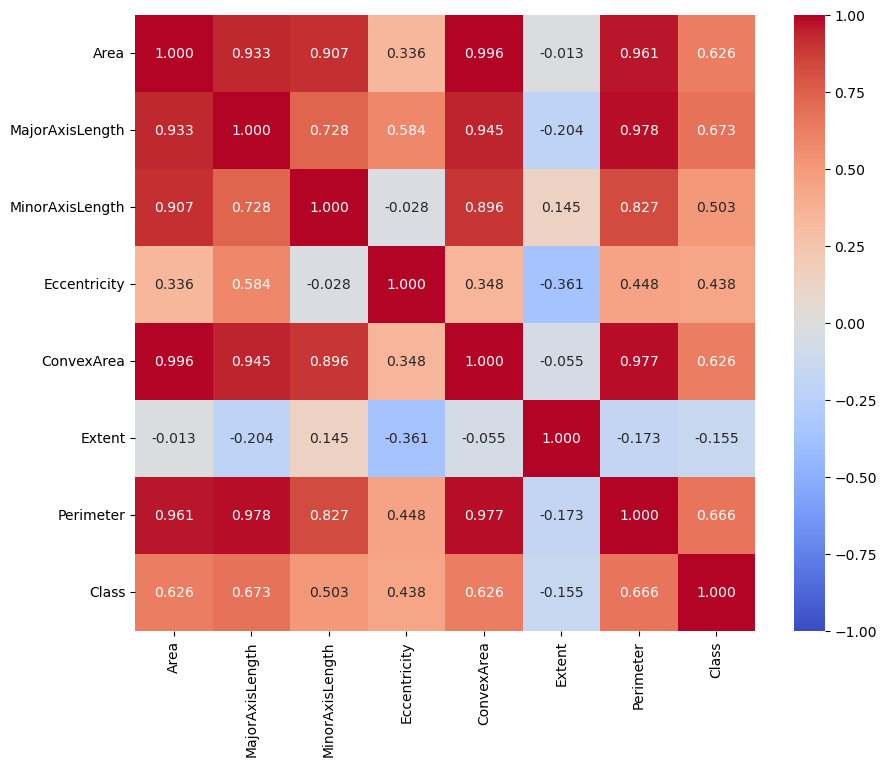

In [17]:
plt.figure(figsize=(10,8))
sns.heatmap(df.select_dtypes(include='number').corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='coolwarm');

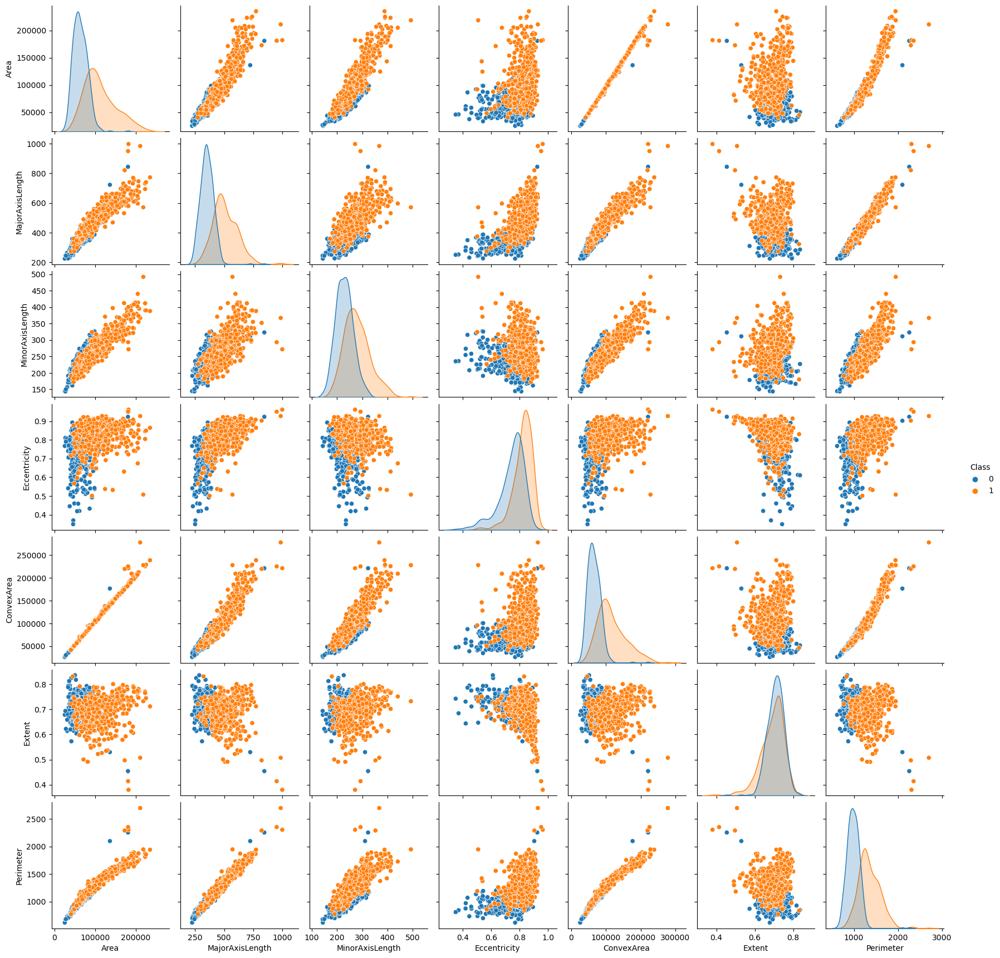

In [19]:
sns.pairplot(df, hue = "Class");

In [20]:
fig = px.scatter_3d(df, x='Perimeter', y='Area', z='Extent', color='Class')
fig.show()

# <font color='blue'> <b>Logistic Regression Model</b><font color='black'>

Örneğin, bir e-ticaret sitesi, bir müşterinin bir ürünü satın alıp almayacağını tahmin etmek istiyor. 

Bağımsız değişkenler arasında müşterinin yaş, cinsiyet, geçmiş alışveriş geçmişi, tıklama geçmişi gibi faktörler bulunabilir. Bu bağımsız değişkenlerin kombinasyonu, müşterinin bir ürünü satın alma olasılığını belirleyen modeli oluşturur.

Logistik regresyon, bağımlı bir değişkenin (bu durumda müşterinin bir ürünü satın alıp almama durumu) bağımsız değişkenlerle ilişkisini modellemek için kullanılan bir istatistiksel yöntemdir.

Logistik regresyon, bağımsız değişkenlerin birleşimiyle doğrusal bir model oluşturur. Bu model, bir kişinin bir ürünü satın alma olasılığını belirlemek için bir logit dönüşümü kullanarak sonuçları 0 ile 1 arasında bir olasılık olarak verir. Bu olasılık, bir eşik değeri (örneğin, 0.5) belirlenerek sınıflandırılır; yani, 0.5'ten büyükse bir müşterinin ürünü satın alma olasılığı yüksektir, aksi takdirde düşüktür.

Sonuç olarak, logistik regresyon, bağımlı bir değişkenin (örneğin, bir müşterinin bir ürünü satın alıp almama durumu) bağımsız değişkenlerle (örneğin, müşterinin yaş, cinsiyet, geçmiş alışveriş geçmişi) ilişkisini modellemek için kullanılan istatistiksel bir tekniktir.

**Temel Kavramlar:**
Logistik regresyon, genellikle evet/hayır gibi ikili sonuçlarla ilişkilendirilen bir bağımlı değişkenin bir veya birden fazla bağımsız değişkenle ilişkisini modellemek için kullanılan bir istatistiksel analiz yöntemidir. Örneğin, bir hastanın bir hastalığa sahip olup olmadığını belirleme veya bir öğrencinin bir sınavı geçme olasılığını tahmin etme gibi durumlarda kullanılabilir.

**Olasılık ve Şans Oranı:**
Logistik regresyon, bir olayın olasılığını (P) ve bu olasılığın şans oranını (odds ratio) tahmin eder. Şans oranı, bir olayın gerçekleşme olasılığının gerçekleşmeme olasılığına oranıdır. Örneğin, bir öğrencinin bir sınavı geçme olasılığı, sınavı geçmemesi olasılığına oranıdır.

**Sigmoid Fonksiyon:**
Logistik regresyon, sonuçları 0 ile 1 arasında sınırlayan sigmoid (S-kümesi) fonksiyonu kullanır. Bu, olasılık tahminleri için idealdir çünkü olasılıkları doğrudan yorumlayabiliriz.

**Matematiksel Model:**
Logistik regresyon modeli genellikle aşağıdaki gibi ifade edilir:

log(P / (1 - P)) = beta_0 + beta_1 * X_1 + beta_2 * X_2 + ... + beta_n * X_n

Burada, P olayın olasılığını, beta_0, beta_1, ..., beta_n katsayıları ve X_1, X_2, ..., X_n bağımsız değişkenleri temsil eder.

**Modelin Yorumlanması:**
Her bir bağımsız değişkenin katsayısı (beta), ilgili değişkenin log-şans oranı üzerindeki etkisini belirtir. Pozitif bir katsayı, ilgili değişkenin artışının olayın olasılığını artırdığını, negatif bir katsayı ise azalttığını gösterir.

**Uygulama Örnekleri:**
Logistik regresyon, tıp (hastalık teşhisi), ekonomi (iflas tahmini), pazarlama (ürün satın alma olasılığı) gibi çeşitli alanlarda kullanılmaktadır.

**Modelin Değerlendirilmesi:**
Modelin performansını değerlendirmek için çeşitli metrikler kullanılır. Bunlar arasında confusion matrix, ROC eğrisi ve AUC değeri gibi metrikler bulunur.

**Önemli Noktalar:**

- Logistic regresyon, lineer regresyon gibi sürekli bir bağımlı değişken yerine, kategorik bir bağımlı değişken ile çalışır.

- Model, olasılık temelli bir yaklaşım sunar ve özellikle ikili sonuçları modellemek için uygundur.

- Modelin varsayımları ve uygulanabilirliği, analiz edilen veriye ve araştırma sorusuna göre değişiklik gösterebilir.

**Logistic regresyonun adında "regresyon" teriminin bulunması**

1. **Lineer Regresyon Temelli**: Logistic regresyon, aslında bir lineer regresyon modelinin genişletilmiş bir formudur. Lineer regresyon, sürekli bir bağımlı değişkeni tahmin etmek için kullanılırken, logistic regresyon, bu yaklaşımı kategorik bir bağımlı değişken (genellikle ikili) için uyarlama şeklinde geliştirilmiştir.

2. **Log-Odds Dönüşümü**: Logistic regresyon, bağımlı değişkenin olasılığını logit fonksiyonu (log-odds) aracılığıyla modelleyerek lineer bir ilişki kurar. Bu yüzden, lineer regresyonun temel prensiplerini takip eder, ancak sonuçları ikili sınıflandırma problemine uyarlar.

3. **Tarihsel Gelişim**: Terimin kökeni, istatistik ve regresyon analizinin erken dönemlerine dayanır. O zamanlar, "regresyon" terimi, veriye en uygun çizgiyi (ya da eğriyi) çekmek için genel olarak kullanılıyordu. Logistic regresyon, bu çerçevede, bağımlı değişkenin olasılık olarak ifade edildiği özel bir regresyon türü olarak geliştirildi.

4. **Modelin Doğası**: Logistic regresyon, bir sınıflandırma algoritması olarak kullanılsa da, aslında temelinde sürekli bir olasılık değerini (0 ile 1 arasında) tahmin eder. Yani, bir yönüyle sürekli bir çıktı üretir, ancak bu çıktı kategorik bir sonucu temsil eder.

5. **İstatistiksel Yaklaşım**: İstatistikte, "regresyon" terimi, bağımsız değişkenlerin bağımlı değişken üzerindeki etkisini modelleme yöntemlerini tanımlar. Logistic regresyon, bu bağlamda, bağımsız değişkenlerin bir kategorik sonuç üzerindeki etkisini modellemek için kullanılır.

Özetle, logistic regresyonun ismi, hem tarihsel kökenleri hem de matematiksel yapısı nedeniyle "regresyon" terimini içerir. Bu, yöntemin hem regresyon analizinin temel prensiplerini takip ettiğini hem de sınıflandırma amaçlı kullanıldığını yansıtır.

https://medium.com/academy-team/lojistik-regresyon-g%C3%BCc%C3%BCn%C3%BC-nereden-al%C4%B1yor-1f7cd17dbb05

## <font color='blue'> <b>Train | Test Split and Scaling</b><font color='black'>

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             900 non-null    int64  
 1   MajorAxisLength  900 non-null    float64
 2   MinorAxisLength  900 non-null    float64
 3   Eccentricity     900 non-null    float64
 4   ConvexArea       900 non-null    int64  
 5   Extent           900 non-null    float64
 6   Perimeter        900 non-null    float64
 7   Class            900 non-null    int64  
dtypes: float64(5), int64(3)
memory usage: 56.4 KB


In [9]:
X = df.drop(["Class"], axis=1)
y = df["Class"]

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    stratify=y,
                                                    random_state=10)

**stratify:** veri setini eğitim ve test setlerine ayırırken sınıf oranlarının korunmasını sağlar. 

**stratify=y:** Eğer veri setinizdeki sınıflar dengesizse (örneğin, bir sınıfın örnek sayısı diğerine göre çok daha fazlaysa), rastgele bir eğitim-test ayrımı yapmak, test setinde bazı sınıfların hiç temsil edilmemesine veya çok az temsil edilmesine neden olabilir. stratify parametresi, bu tür dengesizliklerde bile eğitim ve test setlerindeki sınıf dağılımlarının, orijinal veri setindeki sınıf dağılımıyla aynı olmasını garantiler.

stratify parametresine, sınıf etiketlerini içeren diziyi (genellikle hedef değişken -y-) vererek kullanılır. Bu, eğitim ve test setlerinin ayrılması sırasında sınıf oranlarının korunmasını sağlar.

stratify parametresinin varsayılan değeri -None-. Bu, eğitim ve test setlerinin rastgele ayrılacağı ve sınıf oranlarının korunmayacağı anlamına gelir. Eğer sınıf oranlarını korumak istiyorsanız, bu parametreyi hedef değişken y ile belirtmelisiniz.

## <font color='blue'> <b>Logistic Regression without Pipeline</b><font color='black'>

- **Logistic Regression**,  bir classification (sınıflandırma) metodudur.

- Verilerin belirli bir sınıflandırma kriterine göre ayrılmasını sağlar. 

- Verilerin ikili sınıflarda ayrılmasını veya multi-class sınıflarda ayrılmasını sağlar.

- Bu nedenle sınıflandırma sorunlarını çözen bir metod olarak kategorize edilir.

- Sigmoid fonksiyonu, girdi değerlerini 0 ile 1 arasında sınırlayan bir tür aktivasyon fonksiyonudur.

- Threshold değeri default 0.5 ama değiştirilebilir.

- Logistik regresyonda katsayıları yorumlarken lineer regresyondaki gibi direk yorum yapamıyoruz, odds oranları üzerinden yorum yapabiliyoruz. 

- Logistik regression bizim bildiğimiz klasik linear regression denklemimizi (b2*X2 + b1*X1 +b0) olasılığa (probability) dönüştürür.

**Nerelerde kullanılır?**

- Ikili sınıflandırma sorunlarının çözümü (örneğin: spam/ham e-postalar)
- Öncelikli sınıflandırma sorunlarının çözümü (örneğin: öncelikli/normal e-postalar)
- Tıbbi verilerin sınıflandırılması (örneğin: hastalık/sağlıklı)
- Finansal verilerin sınıflandırılması (örneğin: kârlı/zararlı hisse senetleri)
- Reklam verilerinin sınıflandırılması (örneğin: ilgi alanına uygun/uygun olmayan reklamlar)


**Threshold Değerinin Belirlenmesi**

Threshold değeri, bir modelin tahmin ettiği olasılıkları binary olarak sınıflandırmak için kullanılan bir eşik değeridir. Optimal threshold değeri, sınıflandırma performansını maksimize etmek için belirlenir.

**ROC Eğrisi ve AUC**

ROC eğrisi, modelin farklı threshold değerlerindeki sensitivity (recall) ve specificity değerlerini gösteren bir grafiktir. AUC (Area Under the Curve), ROC eğrisinin altındaki alanı ifade eder ve sınıflandırma performansının bir ölçüsüdür. Optimal threshold değeri, ROC eğrisi üzerinde en yüksek AUC değerine sahip noktayı temsil eder.

**Youden's J İstatistiği**

Youden's J istatistiği, ROC eğrisindeki en yüksek AUC değerine denk gelen threshold değerini bulmak için kullanılır. Formülü şu şekildedir: J = Sensitivity + Specificity - 1. Bu istatistik, sensitivity ve specificity değerlerini dikkate alarak optimal threshold değerini belirler.

**F1 Skoru**

F1 skoru, precision ve recall değerlerinin harmonik ortalamasını temsil eder. F1 skoru, sınıflandırma performansının bir ölçüsüdür ve optimal threshold değeri, en yüksek F1 skorunu veren değer olarak belirlenir.

Bu yöntemlerden birini seçerek, optimal threshold değerini belirleyebilirsiniz. Hangi yöntemin kullanılacağı, veri setinizin özelliklerine ve sınıflandırma amacınıza bağlı olarak belirlenmelidir.

In [24]:
scaler = StandardScaler()

In [25]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# fit işlemi sadece train setine uygulanır ve train setindeki bilgilere istinaden hem train hem de test setine dönüşüm
# uygulanır.

**fit metodu**, bir veri önişleme işlemi için gerekli olan parametreleri öğrenmek ve ayarlamak için kullanılır.

**transform metodu**, öğrenilen parametreleri kullanarak veri setini dönüştürmek için kullanılır.

**fit_transform** fonksiyonu, scaling için kullanılan scaler nesnesini eğitmek ve eğitim veri seti üzerinde scaling işlemini gerçekleştirmek için kullanılır. Bu, eğitim veri setinin istatistik özelliklerini (örneğin, ortalama ve standart sapma gibi) belirler ve bunları kullanarak veriyi ölçekler.

Eğitim seti üzerinde ölçekleme işlemi yapılırken, test seti üzerinde ölçekleme işlemi yapılmazsa, test setindeki veri eğitim setine kıyasla farklı ölçeklerde olabilir. Bu durumda, modelin test verisi üzerindeki performansı doğru şekilde değerlendirilemez çünkü model eğitilirken kullanılan ölçeklendirme kriterleri ile test verisi uyumsuz olabilir.

Bu nedenle, eğitim setine uygulanan ölçeklendirme kriterleri, test setine de uygulanmalıdır. Bu da, eğitim setinde belirlenen ortalama ve standart sapma gibi istatistik bilgilerin, test setindeki veriye uygulanması anlamına gelir. Bu şekilde, modelin test verisi üzerindeki performansı daha güvenilir bir şekilde değerlendirilebilir. Bu yüzden, eğitim veri setine uygulanan ölçekleme kriterleri, test veri setine de uygulanır.

In [26]:
log_model = LogisticRegression()

In [27]:
log_model.fit(X_train_scaled, y_train)

LogisticRegression()

In [28]:
log_model.coef_

array([[ 0.1061352 ,  1.03789291, -1.46242173, -0.24130596,  1.09846161,
        -0.2265741 ,  2.68072308]])

## <font color='blue'> <b>Logistic Regression with Pipeline</b><font color='black'>

**Pipeline**, bir veri işleme sürecindeki adımların birbirine bağlı bir şekilde işlendiği bir kavramdır. 

Bir pipeline, genellikle birkaç adım içerir ve her adım, bir önceki adımın çıktısı üzerinde işlem yapar ve bir sonraki adıma girdi sağlar. 

pipeline içerisine öncelikle fit ve transform işlemlerini yapan dönüşüm algoritmaları sonra da 
fit ve predict işlmelerini yapan ML algoritmaları yazılır.

In [29]:
scaler = StandardScaler()

In [30]:
log_model = LogisticRegression()

In [31]:
log_pipe = Pipeline([("scaler",scaler),("log_model",log_model)]) 

In [32]:
log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log_model', LogisticRegression())])

**log_pipe.fit(X,y) burda sırasıyla ne işlem yapar?**

- pipe_model içerisindeki ilk yapılacak işlem StandardScaler() olduğundan;

- X'e standard scale uygulanır. 

- pipe_model içerisindeki ikinci yapılacak işlem LogisticRegression() olduğundan;

- Scallenmiş X ile birlikte y Logistic modele verilerek eğitim tamamlanır.

In [34]:
y_pred = log_pipe.predict(X_test)
y_pred

array([0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 0], dtype=int64)

In [35]:
y_pred_proba = log_pipe.predict_proba(X_test)
y_pred_proba

array([[9.09233226e-01, 9.07667744e-02],
       [2.13923600e-01, 7.86076400e-01],
       [8.61366061e-01, 1.38633939e-01],
       [9.75006614e-01, 2.49933859e-02],
       [7.18428741e-01, 2.81571259e-01],
       [9.78090204e-01, 2.19097960e-02],
       [9.67153729e-01, 3.28462709e-02],
       [2.69784269e-01, 7.30215731e-01],
       [6.22413524e-01, 3.77586476e-01],
       [8.28165778e-01, 1.71834222e-01],
       [5.50087417e-01, 4.49912583e-01],
       [6.48124125e-01, 3.51875875e-01],
       [1.33636635e-03, 9.98663634e-01],
       [7.34673174e-03, 9.92653268e-01],
       [2.22192344e-04, 9.99777808e-01],
       [4.06025195e-03, 9.95939748e-01],
       [1.03563509e-04, 9.99896436e-01],
       [2.05679569e-01, 7.94320431e-01],
       [8.80378670e-01, 1.19621330e-01],
       [7.27309014e-01, 2.72690986e-01],
       [9.54065988e-01, 4.59340125e-02],
       [6.00635256e-04, 9.99399365e-01],
       [7.48381106e-01, 2.51618894e-01],
       [9.86770325e-01, 1.32296753e-02],
       [2.814178

## <font color='blue'> <b>X_test + y_yest + y_pred + y_pred_proba</b><font color='black'>

In [37]:
test_data = pd.concat([X_test, y_test], axis=1)
test_data

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
375,65999,326.298721,264.414877,0.585952,67971,0.676864,998.793,0
793,76708,458.044640,216.340932,0.881430,78694,0.658393,1135.680,1
360,48809,332.264893,190.351365,0.819632,51847,0.661342,928.016,0
77,42637,293.429580,189.432158,0.763693,44052,0.725119,814.182,0
686,61539,364.255945,220.362020,0.796252,65462,0.723392,1056.491,1
...,...,...,...,...,...,...,...,...
73,68520,373.235638,237.041523,0.772431,70759,0.712859,1049.093,0
62,78571,443.822291,228.757615,0.856934,81718,0.642193,1157.330,0
292,72219,376.650492,249.529454,0.749065,74373,0.777795,1050.221,0
508,133101,641.509739,265.313970,0.910469,136793,0.582496,1544.712,1


In [38]:
test_data["pred_proba"] = y_pred_proba[:,1]
test_data

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class,pred_proba
375,65999,326.298721,264.414877,0.585952,67971,0.676864,998.793,0,0.090767
793,76708,458.044640,216.340932,0.881430,78694,0.658393,1135.680,1,0.786076
360,48809,332.264893,190.351365,0.819632,51847,0.661342,928.016,0,0.138634
77,42637,293.429580,189.432158,0.763693,44052,0.725119,814.182,0,0.024993
686,61539,364.255945,220.362020,0.796252,65462,0.723392,1056.491,1,0.281571
...,...,...,...,...,...,...,...,...,...
73,68520,373.235638,237.041523,0.772431,70759,0.712859,1049.093,0,0.241597
62,78571,443.822291,228.757615,0.856934,81718,0.642193,1157.330,0,0.777250
292,72219,376.650492,249.529454,0.749065,74373,0.777795,1050.221,0,0.169532
508,133101,641.509739,265.313970,0.910469,136793,0.582496,1544.712,1,0.999524


In [39]:
test_data["pred"] = y_pred
test_data

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class,pred_proba,pred
375,65999,326.298721,264.414877,0.585952,67971,0.676864,998.793,0,0.090767,0
793,76708,458.044640,216.340932,0.881430,78694,0.658393,1135.680,1,0.786076,1
360,48809,332.264893,190.351365,0.819632,51847,0.661342,928.016,0,0.138634,0
77,42637,293.429580,189.432158,0.763693,44052,0.725119,814.182,0,0.024993,0
686,61539,364.255945,220.362020,0.796252,65462,0.723392,1056.491,1,0.281571,0
...,...,...,...,...,...,...,...,...,...,...
73,68520,373.235638,237.041523,0.772431,70759,0.712859,1049.093,0,0.241597,0
62,78571,443.822291,228.757615,0.856934,81718,0.642193,1157.330,0,0.777250,1
292,72219,376.650492,249.529454,0.749065,74373,0.777795,1050.221,0,0.169532,0
508,133101,641.509739,265.313970,0.910469,136793,0.582496,1544.712,1,0.999524,1


In [40]:
test_data.sample(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class,pred_proba,pred
352,46601,277.353280,216.272051,0.626065,48457,0.761653,820.106,0,0.014705,0
243,59514,368.637909,209.126925,0.823514,61469,0.755158,968.360,0,0.144181,0
246,46120,300.097158,201.206314,0.741936,49996,0.628972,907.025,0,0.086675,0
203,73193,401.072302,235.828993,0.808864,75563,0.740116,1050.909,0,0.286707,0
71,60449,383.800250,208.168783,0.840128,64346,0.676345,1054.198,0,0.410496,0
413,55129,336.021702,210.428066,0.779636,56855,0.750402,910.837,0,0.063333,0
409,104921,452.863013,297.024187,0.754864,108211,0.726298,1254.861,0,0.730216,1
520,155702,655.398966,304.612149,0.885430,160709,0.697046,1626.909,1,0.999554,1
666,178692,594.722171,384.038046,0.763554,181288,0.747046,1622.032,1,0.995940,1
342,57612,352.441365,210.064210,0.802965,58810,0.647719,934.684,0,0.137725,0


# <font color='blue'> <b>Model Performance</b><font color='black'>

**accuracy:** Gerçek değerlerin ne kadarını doğru bildim

**recall (sensitivity):** Pozitifleri yakalama oranı (1'leri yakalama oranı)

**recall:** Gerçek hayatta 1 olanların ne kadarına modelim 1 dedi

**specificity:** Negatifleri yakalama oranı, recall'un tersi; 0'ları yakalama oranı

**precision:** Pozitif dediklerimden kaçını isabet ettirebildim

**precision:** Modelimin 1 dediklerinin ne kadarı gerçek hayatta 1

**precision:** Modelimin tahmin gücü

**F1:** precision ve recall arasındaki dengeyi ölçer

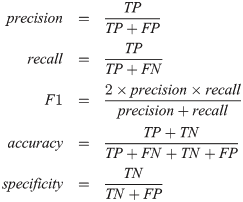

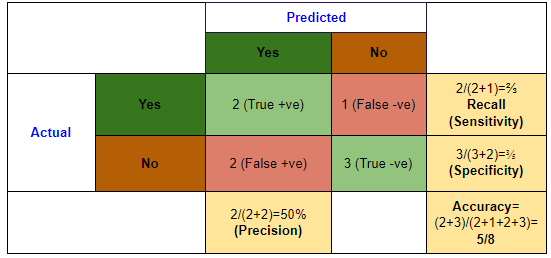

**Accuracy (Doğruluk):** Modelin tüm tahminlerinin ne kadarının doğru olduğunu ifade eder. True Positive (TP) ve True Negative (TN) toplamının, tüm tahminlerin sayısına (TP, TN, False Positive (FP), False Negative (FN) dahil) bölünmesiyle hesaplanır. Formül:
  ```
  Accuracy = (TP + TN) / (TP + TN + FP + FN)
  ```
 - **Sağlık Sektörü:** Bir hastalık tarama testinde, hastalık varlığını ve yokluğunu doğru bir şekilde tespit etme oranı. Doğruluk, testin genel performansını yansıtır ve testin ne kadar güvenilir olduğunu gösterir.  
 
 - **Hava Durumu Tahmini:** Meteoroloji alanında, bir hava durumu tahmin modelinin doğruluğu, belirli bir gün için yağmur ya da güneşli hava gibi hava durumlarını ne kadar doğru tahmin ettiğini gösterir. Doğru tahminler, insanların günlük planlarını daha iyi yapmalarına yardımcı olur. 
  
**Recall (Duyarlılık veya Hassasiyet):** Pozitif sınıfı ne kadar iyi yakaladığını gösterir. Pozitif olarak etiketlenen gerçek örneklerin ne kadarını modelimizin doğru olarak pozitif olarak tahmin ettiğini ifade eder. Formül:
  ```
  Recall = TP / (TP + FN)
  ```

 - **Kanser-Kalp Hastalığı Teşhisi:** Hastalık teşhisinde, duyarlılık oranı, gerçekten kanser-kalp hastası olan hastaların ne kadarının test tarafından doğru bir şekilde pozitif olarak belirlendiğini gösterir. Yüksek duyarlılık, kanserli-kalp hastası hastaların atlanma riskini azaltır. Bu durum, erken müdahale için kritik öneme sahiptir ve kişinin hayatta kalma şansını artırabilir.
  
  
**Specificity (Özgüllük):** Negatif sınıfı ne kadar iyi yakaladığını gösterir ve recall'un tersidir. Yani, negatif olarak etiketlenen gerçek örneklerin ne kadarını doğru olarak negatif tahmin ettiğimizi ölçer. Formül:
  ```
  Specificity = TN / (TN + FP)
  ```
 
 - **Spam Filtreleme:** Bir e-posta servisinde, özgüllük oranı, gerçekten spam olmayan e-postaların ne kadarının doğru bir şekilde güvenli olarak sınıflandırıldığını gösterir. Yüksek özgüllük, önemli e-postaların yanlışlıkla spam olarak işaretlenme riskini azaltır.
 
 - **Güvenlik Sistemleri:** Bir güvenlik sisteminde, yanlış alarmların azaltılması için yüksek özgüllük gereklidir. Güvenlik kamerası veya hareket sensörü tarafından yapılan yanlış pozitif bir sınıflandırma, sahte alarmlara ve gereksiz güvenlik müdahalelerine yol açabilir.
  
**Precision (Kesinlik):** Pozitif olarak tahmin ettiğimiz örneklerden kaçının gerçekten pozitif olduğunu gösterir. Modelin ne kadar "kesin" olduğunu, yani pozitif dediği şeylerin ne kadarının gerçekten pozitif olduğunu ifade eder. Formül:
  ```
  Precision = TP / (TP + FP)
  ```
  
 - **Kredi Skorlaması:** Bir banka tarafından kullanılan kredi riski modelinde, kesinlik oranı, yüksek riskli olarak tahmin edilen kredi başvuru sahiplerinin ne kadarının gerçekten kredi ödemelerinde sorun yaşayacağını gösterir. Yüksek kesinlik, bankanın kredi kaybı riskini azaltmaya yardımcı olur.  
 
 - **Müşteri Hedefleme Kampanyaları:** Bir pazarlama kampanyasında, doğru müşteri segmentine ulaşmak için yüksek kesinliğe ihtiyaç vardır. Müşterilere gönderilen promosyonlar ve reklamlar ne kadar kesin hedeflenirse, dönüşüm oranları o kadar yüksek olur ve pazarlama bütçesi daha verimli kullanılır.
 

Precision ve recall genellikle birbirleriyle ters ilişki içinde olabilir; yani birini artırırken diğerinin düşebileceğini unutmamak önemlidir. Bu yüzden çoğu zaman bu iki metriği dengede tutmak gerekir.

**F1 Skoru:** Harmonik ortalamayı temel alan ve hem precision hem de recall'u dikkate alan bir metriktir.

  ```
  F1 Skoru = 2 * (Precision * Recall) / (Precision + Recall)
  ```

  
 - **Fraud Detection (Sahtekarlık Tespiti):** Finans sektöründe, sahtekarlık tespit sistemlerinde F1 skoru çok önemlidir. Bu tür sistemler genellikle çok düşük oranlarda pozitif örnek içerir (gerçek sahtekârlık vakaları), bu yüzden hem sahte pozitifleri (yanlış alarm) hem de sahte negatifleri (kaçırılan sahtekârlık vakaları) minimize etmek önemlidir. Yüksek bir F1 skoru, sahtekârlık tespit sisteminin hem hassas hem de duyarlı olduğunu gösterir, yani gerçek sahtekârlık olaylarını kaçırmadan doğru bir şekilde tespit etme yeteneğine sahip olduğunu ifade eder.

Bu metrik, hem precision hem de recall'u dengeleyerek, her iki değerin de yüksek olduğu modelleri tercih etme eğilimindedir, bu da özellikle kritik sonuçlar doğurabilecek alanlarda çok önemlidir. F1 skoru, bir modelin genel performansını değerlendirmede çok yararlıdır, özellikle de yanlış negatiflerin ve yanlış pozitiflerin yüksek maliyeti olduğu durumlarda.

In [41]:
accuracy_score(y_test,y_pred)

0.8722222222222222

In [42]:
log_pipe.score(X_test, y_test)

0.8722222222222222

In [43]:
precision_score(y_test, y_pred, pos_label=1)

# default olarak 1 clasının precision_scorunu döndürür. 1 clasını doğru tahmin etmek için 
# yapılan tahminlerden ne kadarının isabetli olduğunu gösterir. 

# precision 0.1 demek model yaptığı tahminlerin %10'ununu tutturdu anlamına gelir.

# 0 clasına ait score için pos_label=0 olarak düzenlenmelidir.

0.8941176470588236

In [44]:
precision_score(y_test, y_pred, pos_label=0)

# default olarak 1 clasının precision_scorunu döndürür. 1 clasını doğru tahmin etmek için 
# yapılan tahminlerden ne kadarının isabetli olduğunu gösterir. 

# precision 0.1 demek model yaptığı tahminlerin %10'ununu tutturdu anlamına gelir.

# 0 clasına ait score için pos_label=0 olarak düzenlenmelidir.

0.8526315789473684

In [45]:
recall_score(y_test, y_pred,  pos_label=1)

# default olarak 1 clasının recall_scorunu döndürür. Modelin 1 classından ne kadarını doğru tespit edebildiğini gösterir

# recall 0.1 demek model 1 clasının sadece %10'nunu tespit edebilmiş anlamına geliyor.

# 0 clasına ait score için pos_label=0 olarak düzenlenmelidir.

0.8444444444444444

In [46]:
recall_score(y_test, y_pred,  pos_label=0)

0.9

In [47]:
f1_score(y_test,y_pred, pos_label=1)

# precision ve recall scorlarının harmonic ortalamasını döndürür. 
# Precision ve recall scorları arasında her zaman bir trade-off vardır.
# precision artarsa/azalırsa recall azalır/artar.

0.8685714285714287

In [48]:
f1_score(y_test,y_pred, pos_label=0)

0.8756756756756757

In [49]:
confusion_matrix(y_test,y_pred)

array([[81,  9],
       [14, 76]], dtype=int64)

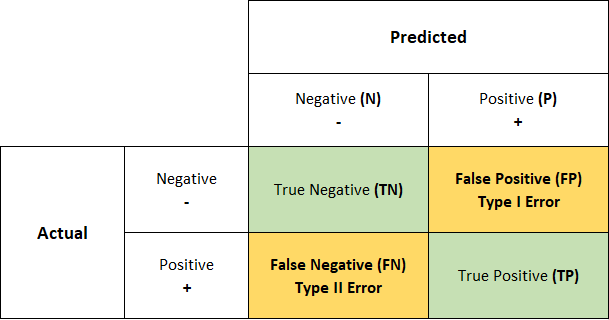

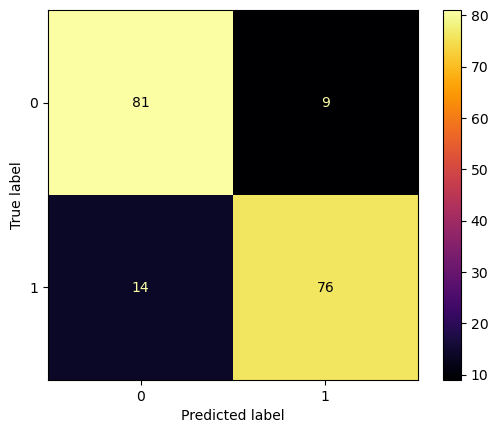

In [50]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_estimator(log_pipe, X_test, y_test, cmap="inferno")

In [51]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [52]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

# precision 0.89 demek yaptığım tahminlerin %89'ü isabetli anlamına geliyor.

# recall 0.84 demek gerçekte 1 olan classların %84'ini doğru tespit ettim anlamına geliyor.

# f1 score, precision ve recall scorlarının harmonic ortalmasını verdiğinden hedef metriğinize (recall, precision)
# göre yorumlanması gerekir. Tek başına yorumlanması yanlış yorumlanmaya sebep verir.

# Datada overfiting olup olmadığı hedef classın test ve train scorları karşılaştırılarak karar verilir. 
# Train setinin scorları test datasından çok daha iyi ise arada uçurum var ise overfiting var demektir.

# Ancak datanın genelindeki train ve test datasına bakarak overfiting/underfiting kararı vermiyoruz. Kesin overfiting 
# underfiting kararını cross_validation sonrası vereceğiz.

Test_Set
[[81  9]
 [14 76]]
              precision    recall  f1-score   support

           0       0.85      0.90      0.88        90
           1       0.89      0.84      0.87        90

    accuracy                           0.87       180
   macro avg       0.87      0.87      0.87       180
weighted avg       0.87      0.87      0.87       180


Train_Set
[[317  43]
 [ 53 307]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       360
           1       0.88      0.85      0.86       360

    accuracy                           0.87       720
   macro avg       0.87      0.87      0.87       720
weighted avg       0.87      0.87      0.87       720



### <font color='orange'> <b>Cross Validate</b><font color='black'>

In [53]:
from sklearn.metrics import get_scorer_names

scorers = get_scorer_names()
print(scorers)

# from sklearn.metrics import SCORERS
# SCORERS.keys()

# Classification modelleri için yapacağımız cross_validation ve gridsearchcv için kullanacağımız metriclerin listesi

# Bu listeden 'accuracy', 'precision','recall','f1' metriclerini alacağız.

['accuracy', 'adjusted_mutual_info_score', 'adjusted_rand_score', 'average_precision', 'balanced_accuracy', 'completeness_score', 'explained_variance', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'fowlkes_mallows_score', 'homogeneity_score', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted', 'matthews_corrcoef', 'max_error', 'mutual_info_score', 'neg_brier_score', 'neg_log_loss', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_gamma_deviance', 'neg_mean_poisson_deviance', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_median_absolute_error', 'neg_negative_likelihood_ratio', 'neg_root_mean_squared_error', 'normalized_mutual_info_score', 'positive_likelihood_ratio', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'r2', 'rand_score', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'roc_auc', 'roc_auc_ovo', 'roc_auc_ovo_weight

In [54]:
model = Pipeline([("scaler",scaler),("log_model",log_model)])

scores = cross_validate(model, X_train, y_train, scoring = ['precision','recall','f1','accuracy'], cv = 10, return_train_score=True)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

# cross_validation üzerinden kesin overfiting/underfiting kararını verebilmek için her iterasyonda hem train hem de validation
# seti scorlarını karşılaştırabilmek için return_train_score=True olarak düzenliyoruz.

# Aşağıda döndürülen scorlar her zaman 1 classına ait scorlardır. 0 clasına ait metriclerin CV scorları için ilave
# başka işlemler yapmamız gerekiyor.


,fit_time,score_time,test_precision,train_precision,test_recall,train_recall,test_f1,train_f1,test_accuracy,train_accuracy
1,0.025986,0.025985,0.935484,0.881789,0.805556,0.851852,0.865672,0.866562,0.875000,0.868827
2,0.021987,0.020988,0.857143,0.878981,0.833333,0.851852,0.845070,0.865204,0.847222,0.867284
3,0.023986,0.021987,0.842105,0.887097,0.888889,0.848765,0.864865,0.867508,0.861111,0.870370
4,0.021987,0.019989,0.767442,0.879365,0.916667,0.854938,0.835443,0.866980,0.819444,0.868827
5,0.023987,0.023986,0.933333,0.876972,0.777778,0.858025,0.848485,0.867395,0.861111,0.868827
6,0.029983,0.025985,0.903226,0.869159,0.777778,0.861111,0.835821,0.865116,0.847222,0.865741
7,0.024987,0.021018,0.942857,0.875399,0.916667,0.845679,0.929577,0.860283,0.930556,0.862654
8,0.023988,0.028023,0.804878,0.882166,0.916667,0.854938,0.857143,0.868339,0.847222,0.870370
9,0.026984,0.025016,0.857143,0.871069,0.833333,0.854938,0.845070,0.862928,0.847222,0.864198
10,0.025016,0.023018,0.967742,0.875796,0.833333,0.848765,0.895522,0.862069,0.902778,0.864198


In [55]:
df_scores.mean()[2:]  

# 1 labelına ait olan train ve validation scorları bu aşamada karşılaştırılıp kesin overfiting/undefiting 
# kararı veriliyor. Aşağıdaki scorlara göre overfiting olmadığını söyleyebiliriz.

test_precision     0.881135
train_precision    0.877779
test_recall        0.850000
train_recall       0.853086
test_f1            0.862267
train_f1           0.865238
test_accuracy      0.863889
train_accuracy     0.867130
dtype: float64

In [56]:
# yukardaki skorları kıyaslamak için koyduk

eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

# Burdan aldığımız scorlar modelin kesin ve nihai scorlarıdır. 
# Bu scorların gerçekten tutarlı scorlar olup olmadığına CV'dan aldığımız validation seti scorları ile 
# karşılaştırarak karar veriyoruz. 
# Eğer scorlar birbirene yakınsa test datasının scorları tutarlıdır diyebiliriz.

Test_Set
[[81  9]
 [14 76]]
              precision    recall  f1-score   support

           0       0.85      0.90      0.88        90
           1       0.89      0.84      0.87        90

    accuracy                           0.87       180
   macro avg       0.87      0.87      0.87       180
weighted avg       0.87      0.87      0.87       180


Train_Set
[[317  43]
 [ 53 307]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       360
           1       0.88      0.85      0.86       360

    accuracy                           0.87       720
   macro avg       0.87      0.87      0.87       720
weighted avg       0.87      0.87      0.87       720



### <font color='orange'> <b>GridSearchCV</b><font color='black'>

In [57]:
log_pipe.get_params()

# gridsearchCV içerisinde eğer pipeline modeli kullanacaksak pipeline içerisine tanımlanmış olan ML algoritmasına ait
# hyper_parametrelerin listesini get_params() ile görebiliyoruz.

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('log_model', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'log_model': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'log_model__C': 1.0,
 'log_model__class_weight': None,
 'log_model__dual': False,
 'log_model__fit_intercept': True,
 'log_model__intercept_scaling': 1,
 'log_model__l1_ratio': None,
 'log_model__max_iter': 100,
 'log_model__multi_class': 'auto',
 'log_model__n_jobs': None,
 'log_model__penalty': 'l2',
 'log_model__random_state': None,
 'log_model__solver': 'lbfgs',
 'log_model__tol': 0.0001,
 'log_model__verbose': 0,
 'log_model__warm_start': False}

Logistic Regression Hyperparametreleri : https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

In [58]:
from sklearn.model_selection import GridSearchCV

**penalty:** arka planda hangi regülarizasyon parametresinin uygulanacağını söylüyor. default l2; l1: Lasso, l2: Ridge

**C:** regülarizasyonun şiddeti, ridge ve lassodaki alpha gibi. Ancak değeri arttıkça regülarizasyon düşer, alphanın tersi olarak. Yani overfitting varsa C değeri düşürülmeli. default: 1

**class_weight:** dengesiz data setlerinde classları dengelemek için class_weight= "balanced" kullanabiliyoruz. Data dengelendiği zaman model az olan sınıfa ait precision scorunu artırarak o sınıfın recall scorunu artırmaya çalışır. class weights are balanced, None: no class weights 

**solver:** modelimizde arka planda bir optimizasyon oluyor hatanın minimize edilmesi için. Solver da optimizasyon aşamasında uyguladığı farklı algoritmalar var. default: lbfgs

In [59]:
# pipeline for logistic regression

model = Pipeline([("scaler", scaler), ("log_model", log_model)])

# l1: Lasso, l2: Ridge
penalty = ["l1", "l2"]

# -1 ile 5 arasında 20 tane C değeri elde etmek için
# C arttıkça regülarizasyon düşer, alphanın tersi olarak
# C için np.logspace kullanmanın nedeni, regülarizasyonun optimal değerinin genellikle belirli bir aralıkta olmamasıdır.
# Bu nedenle, geniş bir aralıkta farklı değerleri denemek ve en iyi sonucu veren değeri bulmak için logaritmik bir ölçekte
# değerler oluşturmak mantıklıdır.
C = np.logspace(-1, 5, 20)

# balanced: sınıf ağırlıkları dengeli, None: sınıf ağırlığı yok
class_weight = ["balanced", None]
# dengesiz data setlerinde classları dengelemek için class_weight= "balanced" kullanabiliyoruz. Data dengelendiği zaman
# model az olan sınıfa ait precision scorunu artırarak o sınıfın recall scorunu artırmaya çalışır.

# solver ın dört değeri
solver = ["lbfgs", "liblinear", "sag", "saga"]

# penalty, C, class_weight ve solver'ın tüm kombinasyonlarını elde etmek için
param_grid = {
    "log_model__penalty": penalty,
    "log_model__C": [C, 1],
    "log_model__class_weight": class_weight,
    "log_model__solver": solver
}

# en iyi modeli elde etmek için
grid_model = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    cv=10,
    scoring='accuracy',
    n_jobs=-1)

In [60]:
grid_model.fit(X_train,y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('log_model', LogisticRegression())]),
             n_jobs=-1,
             param_grid={'log_model__C': [array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02, 1.27427499e+03, 2.63665090e+03, 5.45559478e+03,
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                                          1],
                         'log_model__class_weight': ['balanced', None],
                         'log_model__penalty': ['l1', 'l2'],
                         'log_model__solver': ['lbfgs', 'liblinear', 'sag',
                                               'saga']},
             scoring='accuracy')

In [61]:
grid_model.best_params_

{'log_model__C': 1,
 'log_model__class_weight': 'balanced',
 'log_model__penalty': 'l1',
 'log_model__solver': 'liblinear'}

In [62]:
grid_model.best_index_

17

In [63]:
grid_model.best_score_

0.8652777777777778

In [64]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  

# test seti doğruluğu 0,87'den 0,88'e yükseldi, 21 yanlış tahmin
# yukardaki test setine göre 1 puan artmış, hata sayısı da 23den 21e düşmüş

Test_Set
[[79 11]
 [10 80]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.88        90
           1       0.88      0.89      0.88        90

    accuracy                           0.88       180
   macro avg       0.88      0.88      0.88       180
weighted avg       0.88      0.88      0.88       180


Train_Set
[[316  44]
 [ 53 307]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       360
           1       0.87      0.85      0.86       360

    accuracy                           0.87       720
   macro avg       0.87      0.87      0.87       720
weighted avg       0.87      0.87      0.87       720



### <font color='orange'> <b>Precision-Recall Curve & ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b><font color='black'>

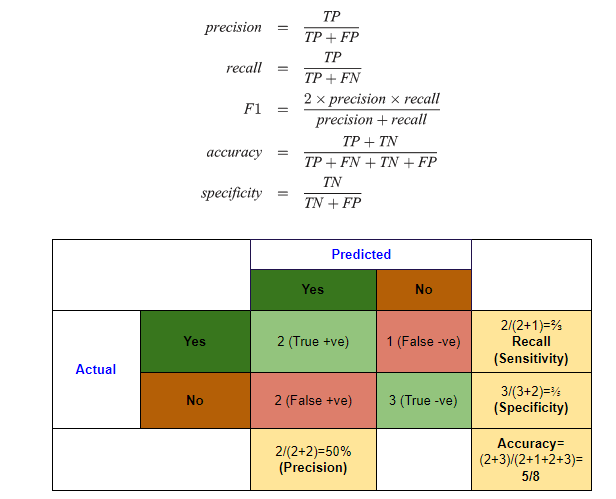

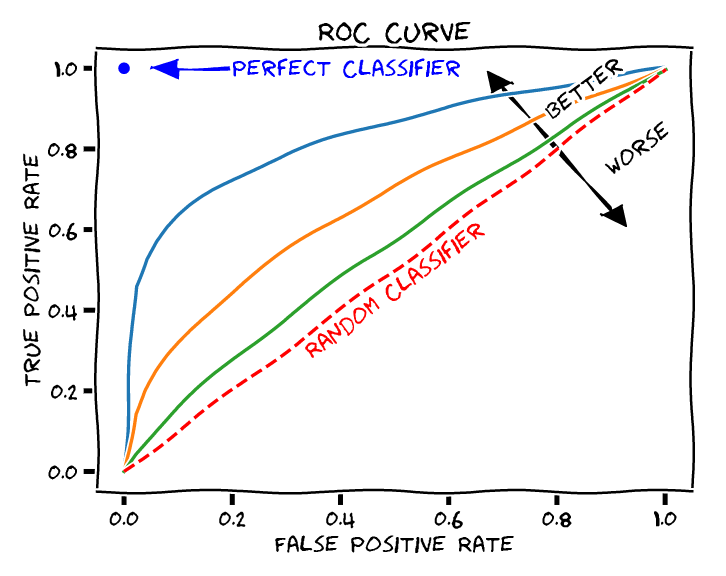

1. **Average Precision (AP):**

   - AP, özellikle dengesiz (unbalanced) sınıflandırma problemleri için idealdir. Örneğin, tıbbi teşhisler veya anormallik tespiti gibi durumlarda bir sınıf diğerine göre çok daha nadir olabilir.
   
   - AP, sınıflandırma modelinin gerçek pozitifleri doğru bir şekilde saptadığı oranı ölçer. Bu, yanlış pozitiflerin sayısını minimize etmeye odaklanır.
   
   - AP, doğru sınıflandırılmış pozitiflerin (True Positives, TP) ve yanlış pozitiflerin (False Positives, FP) sayısını kullanır. Precision-Recall eğrisi üzerinden hesaplanır. Precision, gerçek pozitiflerin toplam pozitif tahminlere oranını ifade ederken, Recall (duyarlılık), gerçek pozitiflerin toplam gerçek pozitif örnek sayısına oranını ifade eder.
   
   - Bir örnek vermek gerekirse, bir kanser teşhis modeli için AP, gerçek kanser vakalarını kaçının doğru bir şekilde tespit edildiğini ölçer.


2. **Receiver Operating Characteristic Area Under the Curve (ROC AUC):**

   - ROC AUC, dengeli (balanced) veri kümeleri için daha uygundur. Yani, sınıf dengesi konusunda herhangi bir belirgin sapma olmadığı durumlarda kullanılır.
   
   - Modelin hem pozitif hem de negatif sınıfları nasıl ayırdığını ölçer. Bu, yanlış pozitiflerin ve yanlış negatiflerin etkilerini dikkate alır.
   
   - ROC AUC, sınıflandırma eşik değerini değiştirerek farklı precision ve recall değerlerini değerlendirir ve bu değerlerin grafiğini çizer. ROC eğrisi, bu eşik değerlerine bağlı olarak True Positive Rate (TPR) ve False Positive Rate (FPR) arasındaki ilişkiyi gösterir.
     
   - ROC AUC, sınıflandırma modelinin sınıflar arasındaki ayrım gücünü ölçer. 1'e ne kadar yakınsa, modelin performansı o kadar iyidir.
   
   - Örneğin, bir spam filtresi modeli için ROC AUC, hem spam hem de spam olmayan e-postaları doğru bir şekilde ayırt etme yeteneğini ölçer.

Hangi metriğin kullanılacağı, problem bağlamına ve hedeflerinize bağlıdır. 

Örneğin, nadir durumların doğru bir şekilde tespit edilmesi gereken durumlarda AP tercih edilirken, sınıflar arasındaki ayrımın genel bir değerlendirmesi gerekiyorsa ROC AUC kullanılabilir. 

Genellikle her iki metrik de birlikte kullanılır ve her ikisinin de yüksek değerlere sahip olması istenir.

Ancak, her problem farklı olduğundan, hangi metriğin önceliklendirilmesi gerektiğini dikkatlice değerlendirmek önemlidir.

**ROC Eğrisinin Amacı:**

1. Bir sınıflandırıcının gücünü/tahmin gücünü analiz etmek. 

2. Optimal eşiğin belirlenmesi.

3. İki modelin karşılaştırılması (eğrinin altındaki alan kullanılarak).

**ROC Eğrisi (Receiver Operating Characteristic)**

- Kökenleri İkinci Dünya Savaşı'na dayanmaktadır. 

- İkinci Dünya Savaşı sırasında radar sinyal işleme tekniklerini değerlendirmek için kullanılan bir araçtır. Bu eğri, radar operatörlerinin düşman uçaklarını tespit etme yeteneğini ölçmek için geliştirilmiştir.

- Pearl Harbor saldırısından sonra, ABD ordusu radar teknolojisini geliştirmek için yoğun bir çaba içine girdi. Bu çabaların bir parçası olarak, radar sinyallerinin doğruluğunu ve güvenilirliğini değerlendirmek için ROC eğrisi kullanıldı. Buradaki temel amaç, düşman uçaklarını doğru bir şekilde tespit ederken yanlış alarm oranını en aza indirmekti.

- ROC eğrisi, bir sınıflandırıcının tüm olası eşik değerleri için gerçek pozitif oranı (True Positive Rate) ile yanlış pozitif oranı (False Positive Rate) arasındaki ilişkiyi gösterir. Bu, sınıflandırıcının performansını değerlendirmek için mükemmel bir araçtır, çünkü sadece bir eşik değeri için değil, tüm olası eşik değerleri için performansı gösterir.

- Amaç, tahmin edicinin, false pozitifleri en aza indirirken mümkün olduğunca çok sayıda gerçek pozitifin tespit edilmesini sağlamadaki tahmin gücünü analiz etmektir.

**ROC AUC Curve**
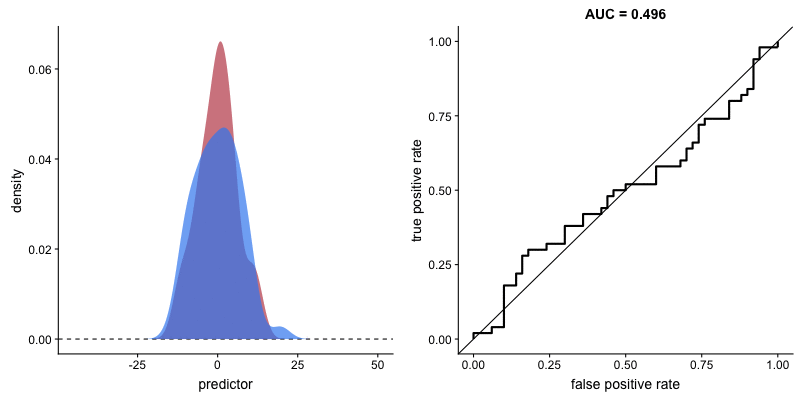

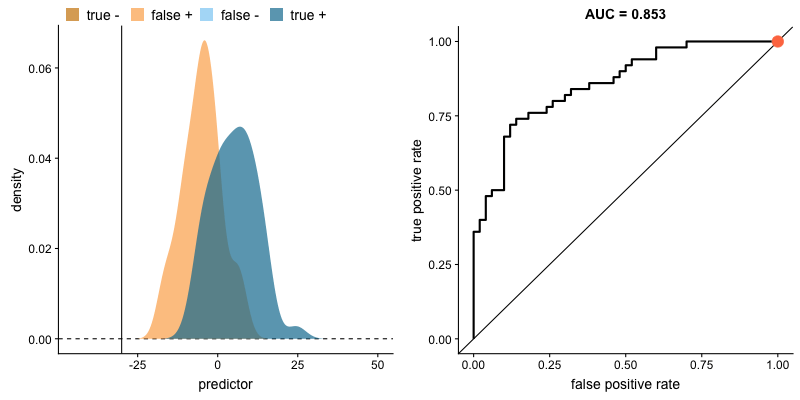

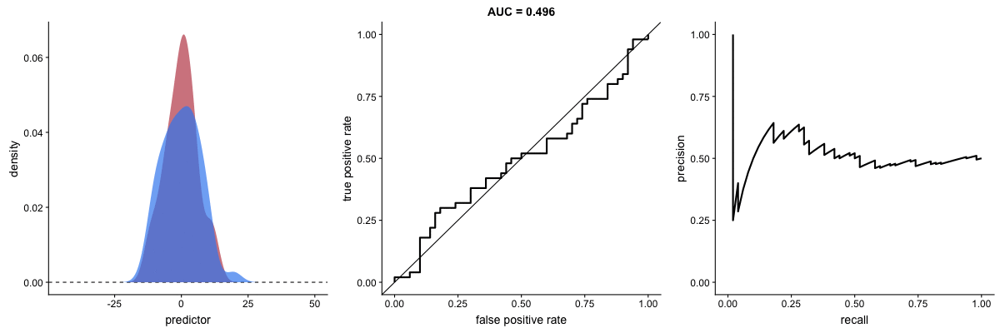

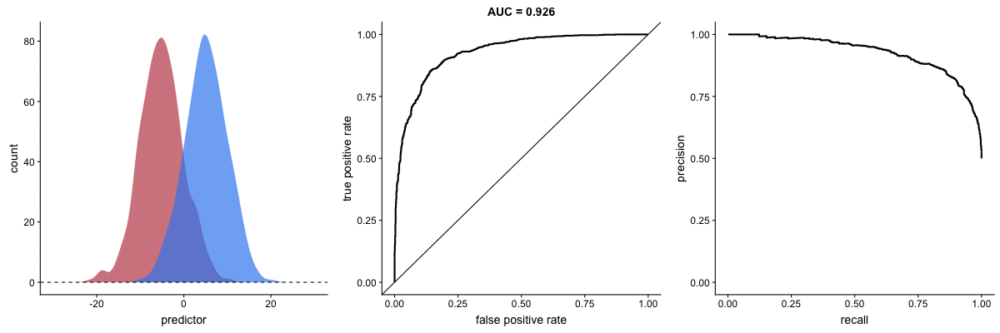

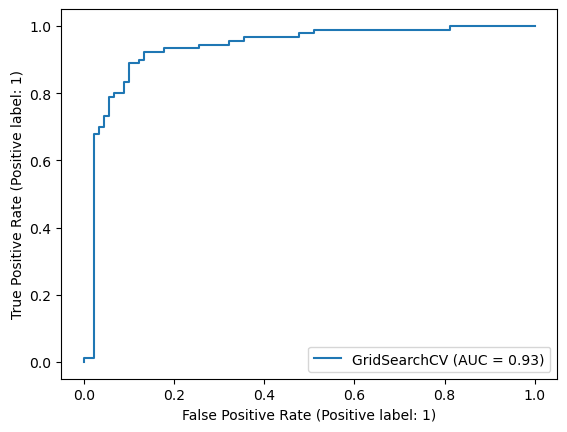

In [65]:
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(grid_model, X_test, y_test)

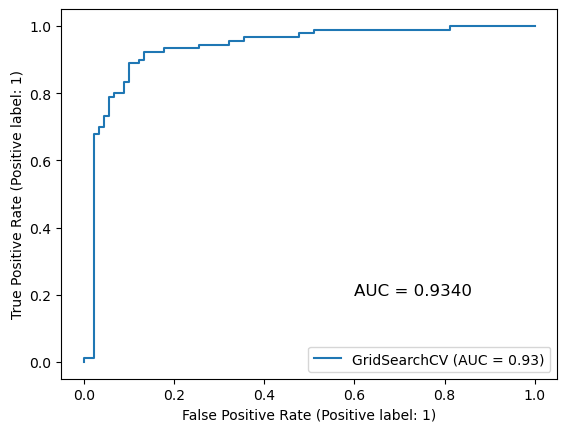

In [66]:
y_pred_proba = grid_model.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, y_pred_proba)

RocCurveDisplay.from_estimator(grid_model, X_test, y_test)

plt.text(0.6, 0.2, f'AUC = {auc:.4f}', fontsize=12)
plt.show()

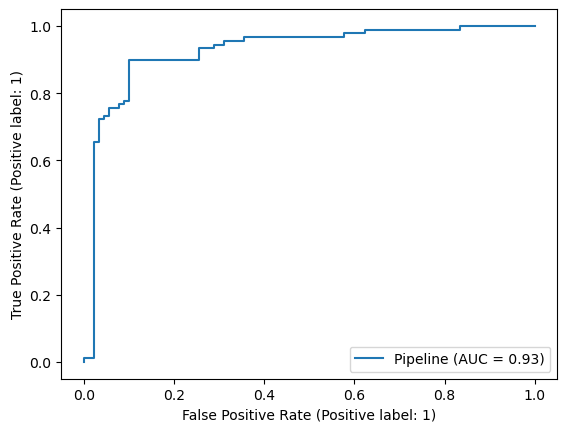

In [67]:
RocCurveDisplay.from_estimator(log_pipe, X_test, y_test); 

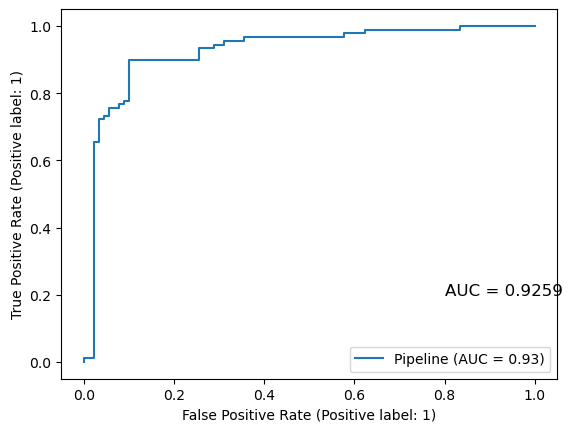

In [68]:
y_pred_proba = log_pipe.predict_proba(X_test)[:, 1]
auc = roc_auc_score(y_test, y_pred_proba)

RocCurveDisplay.from_estimator(log_pipe, X_test, y_test)

plt.text(0.8, 0.2, f'AUC = {auc:.4f}', fontsize=12)
plt.show()

In [69]:
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_test, log_pipe.predict_proba(X_test)[:, 1])

print("Precision:", precision)
print("Recall:", recall)
print("Thresholds:", thresholds)

Precision: [0.5        0.5027933  0.50561798 0.50847458 0.51136364 0.51428571
 0.51724138 0.52023121 0.52325581 0.52631579 0.52941176 0.53254438
 0.53571429 0.53892216 0.54216867 0.54545455 0.54268293 0.54601227
 0.54938272 0.55279503 0.55625    0.55974843 0.56329114 0.56687898
 0.57051282 0.57419355 0.57792208 0.58169935 0.58552632 0.58940397
 0.59333333 0.59731544 0.60135135 0.60544218 0.60958904 0.6137931
 0.61111111 0.61538462 0.61971831 0.62411348 0.62857143 0.62589928
 0.63043478 0.6350365  0.63970588 0.64444444 0.64925373 0.65413534
 0.65909091 0.66412214 0.66923077 0.6744186  0.6796875  0.68503937
 0.69047619 0.696      0.7016129  0.70731707 0.71311475 0.71900826
 0.725      0.73109244 0.72881356 0.73504274 0.74137931 0.74782609
 0.75438596 0.75221239 0.75892857 0.76576577 0.76363636 0.7706422
 0.77777778 0.78504673 0.78301887 0.78095238 0.77884615 0.78640777
 0.79411765 0.8019802  0.81       0.81818182 0.82653061 0.83505155
 0.84375    0.85263158 0.86170213 0.87096774 0.880434

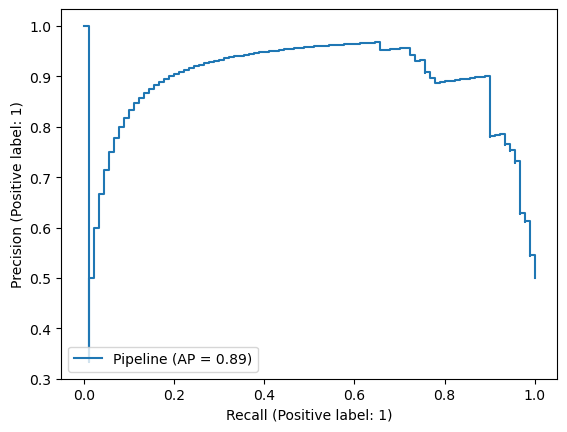

In [72]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_estimator(log_pipe, X_test, y_test)

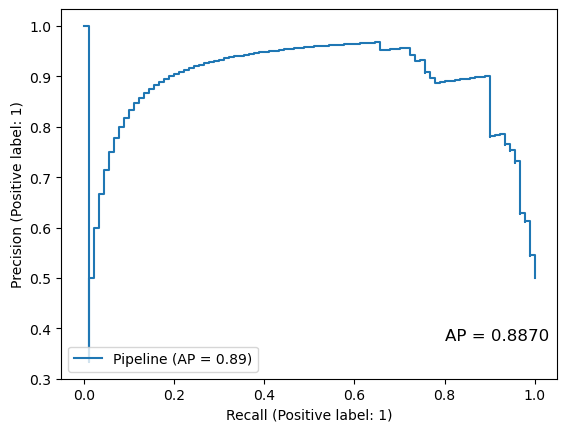

In [73]:
y_pred_proba = log_pipe.predict_proba(X_test)[:, 1]
average_precision = average_precision_score(y_test, y_pred_proba)

PrecisionRecallDisplay.from_estimator(log_pipe, X_test, y_test)

plt.text(0.8, 0.4, f'AP = {average_precision:.4f}', fontsize=12, va='top', ha='left')
plt.show()

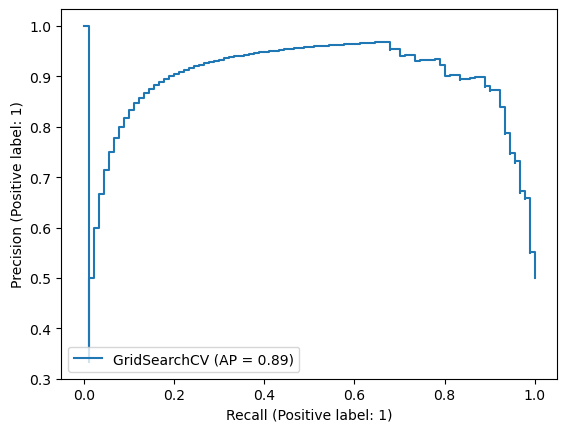

In [74]:
PrecisionRecallDisplay.from_estimator(grid_model, X_test, y_test);

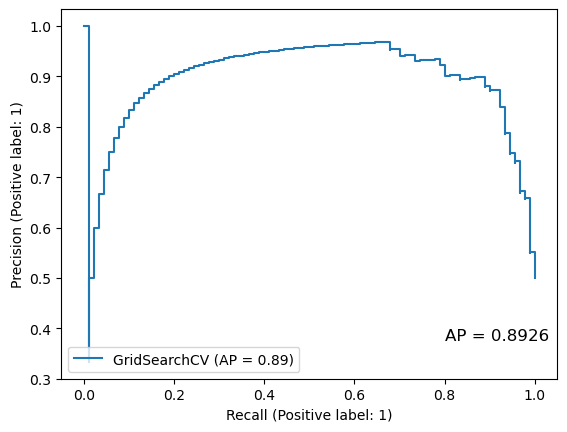

In [75]:
y_pred_proba = grid_model.predict_proba(X_test)[:, 1]
average_precision = average_precision_score(y_test, y_pred_proba)

PrecisionRecallDisplay.from_estimator(grid_model, X_test, y_test)

plt.text(0.8, 0.4, f'AP = {average_precision:.4f}', fontsize=12, va='top', ha='left')
plt.show()

# <font color='blue'> <b>Prediction</b><font color='black'>

In [76]:
new_data = pd.read_excel("Raisin_Dataset_new.xlsx") 

In [77]:
final_scaler = StandardScaler()
final_model = LogisticRegression()

In [78]:
final_pipe = Pipeline([("scaler", final_scaler), ("log_model", final_model)])

In [79]:
final_pipe.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log_model', LogisticRegression())])

In [80]:
predictions = final_pipe.predict(new_data)

In [81]:
positive_class_proba = final_pipe.predict_proba(new_data)[:, 1]

In [82]:
results = pd.DataFrame({
    'Tahmin': predictions,
    'Pozitif Sınıf Olasılığı': positive_class_proba
})

results

,Tahmin,Pozitif Sınıf Olasılığı
0,1,0.651376
1,0,0.132203
2,0,0.086283
3,0,0.024742
4,0,0.123196
5,1,0.572805
6,1,0.743543
7,1,0.728312
8,1,0.863969
9,1,0.938375


# <font color='blue'> <b>Conclusion</b><font color='black'>